In [2]:
import pandas as pd
import numpy as np
import matplotlib as plt
%matplotlib inline

In [3]:
# replacing a list of missing/incorrect values while reading CSV 
na_vals = ['NA', 'Missing']
df = pd.read_csv('data/survey_results_public.csv', index_col='Respondent', na_values=na_vals)
schema_df = pd.read_csv('data/survey_results_schema.csv', index_col='Column')
eth_df = pd.read_csv('data/ETH_1h.csv')

In [40]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [5]:
#df.shape
#df.info()
df.head(10)
#df.tail()
schema_df

,QuestionText
Column,
Respondent,Randomized respondent ID number (not in order ...
MainBranch,Which of the following options best describes ...
Hobbyist,Do you code as a hobby?
OpenSourcer,How often do you contribute to open source?
OpenSource,How do you feel about the quality of open sour...
Employment,Which of the following best describes your cur...
Country,In which country do you currently reside?
Student,"Are you currently enrolled in a formal, degree..."
EdLevel,Which of the following best describes the high...


### 1. SELECTING ROWS AND COLUMNS ##

##### ILOC (slicing)
when using slicing with iloc function - the ending index is exclusive

In [19]:
df.iloc[0,0]
df.iloc[[0,3,5,6]]
df.iloc[[0,2,4,5], [2, 4, 5, 6]]
# using iloc[] slicing on a DATAFRAME
df.iloc[1:11, 2:4]

'I am a student who is learning to code'

##### LOC (slicing)
when using slicing with loc function - the ending index is inclusive

In [28]:
# using loc[] on a DATAFRAME
df.loc[1,'Hobbyist']
df.loc[[2, 5, 7, 55], ['Hobbyist', 'OpenSourcer']]
df.loc[1:11, 'Hobbyist':'Employment']

,Hobbyist,OpenSourcer,OpenSource,Employment
Respondent,,,,
1,Yes,Never,The quality of OSS and closed source software ...,"Not employed, and not looking for work"
2,No,Less than once per year,The quality of OSS and closed source software ...,"Not employed, but looking for work"
3,Yes,Never,The quality of OSS and closed source software ...,Employed full-time
4,No,Never,The quality of OSS and closed source software ...,Employed full-time
5,Yes,Once a month or more often,"OSS is, on average, of HIGHER quality than pro...",Employed full-time
6,Yes,Never,The quality of OSS and closed source software ...,Employed full-time
7,No,Never,The quality of OSS and closed source software ...,"Independent contractor, freelancer, or self-em..."
8,Yes,Less than once per year,"OSS is, on average, of HIGHER quality than pro...","Not employed, but looking for work"
9,Yes,Once a month or more often,The quality of OSS and closed source software ...,Employed full-time


In [48]:
schema_df
schema_df.loc['MgrIdiot']
schema_df.loc['MgrIdiot', 'QuestionText']

,QuestionText
Column,
Age,What is your age (in years)? If you prefer not...
Age1stCode,At what age did you write your first line of c...
BetterLife,Do you think people born today will have a bet...
BlockchainIs,Blockchain / cryptocurrency technology is prim...
BlockchainOrg,How is your organization thinking about or imp...
CareerSat,"Overall, how satisfied are you with your caree..."
CodeRev,Do you review code as part of your work?
CodeRevHrs,"On average, how many hours per week do you spe..."
CompFreq,"Is that compensation weekly, monthly, or yearly?"


### 2. SORTING INDEXES

In [16]:
schema_df.sort_index(ascending=True, inplace=True)
schema_df

,QuestionText
Column,
Age,What is your age (in years)? If you prefer not...
Age1stCode,At what age did you write your first line of c...
BetterLife,Do you think people born today will have a bet...
BlockchainIs,Blockchain / cryptocurrency technology is prim...
BlockchainOrg,How is your organization thinking about or imp...
CareerSat,"Overall, how satisfied are you with your caree..."
CodeRev,Do you review code as part of your work?
CodeRevHrs,"On average, how many hours per week do you spe..."
CompFreq,"Is that compensation weekly, monthly, or yearly?"


### 3. FILTERING

In [17]:
high_salary = (df['ConvertedComp'] > 70000)
df.loc[high_salary, ['ConvertedComp', 'Country', 'LanguageWorkedWith']]

,ConvertedComp,Country,LanguageWorkedWith
Respondent,,,
6,366420.0,Canada,Java;R;SQL
9,95179.0,New Zealand,Bash/Shell/PowerShell;C#;HTML/CSS;JavaScript;P...
13,90000.0,United States,Bash/Shell/PowerShell;HTML/CSS;JavaScript;PHP;...
16,455352.0,United Kingdom,Bash/Shell/PowerShell;C#;HTML/CSS;JavaScript;T...
22,103000.0,United States,Bash/Shell/PowerShell;C++;HTML/CSS;JavaScript;...
26,114000.0,United States,Bash/Shell/PowerShell;C++;C#;HTML/CSS;JavaScri...
29,100000.0,United States,Bash/Shell/PowerShell;JavaScript;SQL
30,90417.0,Switzerland,NaN
32,1100000.0,United States,Bash/Shell/PowerShell;HTML/CSS;JavaScript;PHP;...


In [18]:
countries = ['United States', 'India', 'United Kingdom', 'Germany', 'Canada']
countries_filter = df['Country'].isin(countries)
df.loc[countries_filter, 'Country']

Respondent
1        United Kingdom
4         United States
6                Canada
8                 India
10                India
12               Canada
13        United States
14              Germany
15                India
16       United Kingdom
21               Canada
22        United States
23        United States
26        United States
29        United States
31               Canada
32        United States
35        United States
36              Germany
37               Canada
39        United States
44              Germany
45        United States
46        United States
47        United States
50                India
51        United States
53        United States
58        United States
60        United States
61        United States
65                India
66              Germany
68                India
70        United States
75                India
76       United Kingdom
77        United States
78                India
79               Canada
80       United Kingdom
82   

In [19]:
# combining multiple filters
lang_filter = df['LanguageWorkedWith'].str.contains('Python', na=False) # using str functions
high_salary_and_country_filter = salary_filter & countries_filter & lang_filter
df.loc[high_salary_and_country_filter, ['ConvertedComp', 'Country', 'LanguageWorkedWith']]

,ConvertedComp,Country,LanguageWorkedWith
Respondent,,,
22,103000.0,United States,Bash/Shell/PowerShell;C++;HTML/CSS;JavaScript;...
26,114000.0,United States,Bash/Shell/PowerShell;C++;C#;HTML/CSS;JavaScri...
32,1100000.0,United States,Bash/Shell/PowerShell;HTML/CSS;JavaScript;PHP;...
45,175000.0,United States,Python
60,107000.0,United States,Bash/Shell/PowerShell;Go;JavaScript;PHP;Python...
82,143932.0,United Kingdom,Bash/Shell/PowerShell;C++;HTML/CSS;Java;JavaSc...
95,110000.0,United States,C#;HTML/CSS;JavaScript;Python;R;SQL
106,160000.0,United States,Bash/Shell/PowerShell;HTML/CSS;Java;JavaScript...
108,140000.0,United States,C++;Python


In [11]:
## UPDATING ROWS AND COLUMNS ##
df.rename(columns={'ConvertedComp': 'SalaryUSD'})
df = df.rename(columns={'ConvertedComp': 'SalaryUSD'})
df['Hobbyist'].map({})

KeyboardInterrupt: 

In [6]:
## Data Science ##
# describe() gives statisticals information for all numerical columns
df.describe()

Respondent
1            NaN
2            NaN
3         8820.0
4        61000.0
5            NaN
          ...   
88377        NaN
88601        NaN
88802        NaN
88816        NaN
88863        NaN
Name: ConvertedComp, Length: 88883, dtype: float64

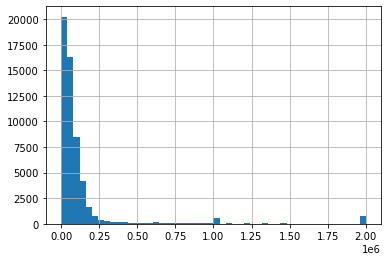

In [22]:
# hist shows a histogram
pd.set_option('display.max_rows', 88883)
df['ConvertedComp'].hist(bins=50)

In [49]:
# use following code to FIND NULL VALUES IN EACH COLUMN
df.apply(lambda x: sum(x.isnull()), axis =0)

MainBranch                  552
Hobbyist                      0
OpenSourcer                   0
OpenSource                 2041
Employment                 1702
Country                     132
Student                    1869
EdLevel                    2493
UndergradMajor            13269
EduOther                   4623
OrgSize                   17092
DevType                    7548
YearsCode                   945
Age1stCode                 1249
YearsCodePro              14552
CareerSat                 16036
JobSat                    17895
MgrIdiot                  27724
MgrMoney                  27726
MgrWant                   27651
JobSeek                    8328
LastHireDate               9029
LastInt                   21728
FizzBuzz                  17539
JobFactors                 9512
ResumeUpdate              11006
CurrencySymbol            17491
CurrencyDesc              17491
CompTotal                 32938
CompFreq                  25615
ConvertedComp             33060
WorkWeek

In [64]:
## SORTING DATA ##
df.sort_values(by=['Country', 'ConvertedComp'], ascending=[False, True], inplace=True)

In [67]:
df[['Country', 'ConvertedComp']].head(10)

,Country,ConvertedComp
Respondent,,
47247,Zimbabwe,900.0
6492,Zimbabwe,6000.0
30743,Zimbabwe,7800.0
84155,Zimbabwe,12000.0
35092,Zimbabwe,12000.0
54422,Zimbabwe,15000.0
1886,Zimbabwe,18000.0
2530,Zimbabwe,19200.0
66459,Zimbabwe,24000.0


In [72]:
# finding the largest value in a column and viewing only the column value
df['ConvertedComp'].nlargest(10)
# find the largest value in a column and viewing the entire dataframe
df.nlargest(10, 'ConvertedComp')

,MainBranch,Hobbyist,OpenSourcer,OpenSource,Employment,Country,Student,EdLevel,UndergradMajor,EduOther,OrgSize,DevType,YearsCode,Age1stCode,YearsCodePro,CareerSat,JobSat,MgrIdiot,MgrMoney,MgrWant,JobSeek,LastHireDate,LastInt,FizzBuzz,JobFactors,ResumeUpdate,CurrencySymbol,CurrencyDesc,CompTotal,CompFreq,ConvertedComp,WorkWeekHrs,WorkPlan,WorkChallenge,WorkRemote,WorkLoc,ImpSyn,CodeRev,CodeRevHrs,UnitTests,PurchaseHow,PurchaseWhat,LanguageWorkedWith,LanguageDesireNextYear,DatabaseWorkedWith,DatabaseDesireNextYear,PlatformWorkedWith,PlatformDesireNextYear,WebFrameWorkedWith,WebFrameDesireNextYear,MiscTechWorkedWith,MiscTechDesireNextYear,DevEnviron,OpSys,Containers,BlockchainOrg,BlockchainIs,BetterLife,ITperson,OffOn,SocialMedia,Extraversion,ScreenName,SOVisit1st,SOVisitFreq,SOVisitTo,SOFindAnswer,SOTimeSaved,SOHowMuchTime,SOAccount,SOPartFreq,SOJobs,EntTeams,SOComm,WelcomeChange,SONewContent,Age,Gender,Trans,Sexuality,Ethnicity,Dependents,SurveyLength,SurveyEase
Respondent,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2940,I am a developer by profession,Yes,Never,"OSS is, on average, of HIGHER quality than pro...",Employed full-time,United States,No,"Bachelor’s degree (BA, BS, B.Eng., etc.)","Computer science, computer engineering, or sof...",Received on-the-job training in software devel...,500 to 999 employees,"Developer, embedded applications or devices",9,19,4,Very satisfied,Slightly satisfied,Not at all confident,Yes,No,"I’m not actively looking, but I am open to new...",1-2 years ago,"Write any code;Write code by hand (e.g., on a ...",No,"Languages, frameworks, and other technologies ...",I was preparing for a job search,USD,United States dollar,175000.0,Weekly,2000000.0,40.0,There is a schedule and/or spec (made by me or...,Being tasked with non-development work;Distrac...,Less than once per month / Never,Office,A little above average,"Yes, because I was told to do so",4.0,"No, but I think we should",Not sure,I have little or no influence,C++;Go,C++;Go,NaN,PostgreSQL,Linux,Linux,NaN,NaN,NaN,NaN,Sublime Text;Vim,Linux-based,I do not use containers,Not at all,Useful for immutable record keeping outside of...,Yes,SIGH,Yes,WhatsApp,In real life (in person),Username,2012,A few times per month or weekly,Find answers to specific questions;Contribute ...,Less than once per week,Stack Overflow was much faster,60+ minutes,Yes,A few times per month or weekly,"No, I knew that Stack Overflow had a job board...","No, and I don't know what those are","Yes, somewhat",Just as welcome now as I felt last year,NaN,28.0,Man,No,Straight / Heterosexual,Hispanic or Latino/Latina,No,Appropriate in length,Easy
3133,I am a developer by profession,Yes,Never,"OSS is, on average, of HIGHER quality than pro...",Employed full-time,United States,No,"Bachelor’s degree (BA, BS, B.Eng., etc.)",Mathematics or statistics,Taken an online course in programming or softw...,"10,000 or more employees","Developer, back-end;Developer, full-stack",7,13,5,Slightly satisfied,Neither satisfied nor dissatisfied,Very confident,Not sure,Not sure,"I’m not actively looking, but I am open to new...",1-2 years ago,"Write any code;Write code by hand (e.g., on a ...",Yes,"Languages, frameworks, and other technologies ...",I was preparing for a job search,USD,United States dollar,140000.0,Weekly,2000000.0,40.0,There is a schedule and/or spec (made by me or...,Being tasked with non-development work;Inadequ...,Less than once per month / Never,Office,Average,"Yes, because I see value in code review",3.0,"Yes, it's part of our process","The CTO, CIO, or other management purchase new...",I have little or no influence,Bash/Shell/PowerShell;Go;HTML/CSS;JavaScript;P...,Go;Rust,DynamoDB;SQLite,DynamoDB;SQLite,AWS;Linux,AWS;Google Cloud Platform;Linux,NaN,NaN,Node.js;Unity 3D,Torch/PyTorch;Unity 3D,IntelliJ;Sublime Text;Vim;Visual Studio Code,MacOS,Production,Not at all,An irresponsible use of resources,No,Also Yes,Yes,Reddit,In real life (in person),

In [74]:
# find the smallest value in a column and viewing only the column value
df['ConvertedComp'].nsmallest(10)
# finding the smallest value in a column and viewing the entire dataframe
df.nsmallest(10, 'ConvertedComp')

,MainBranch,Hobbyist,OpenSourcer,OpenSource,Employment,Country,Student,EdLevel,UndergradMajor,EduOther,OrgSize,DevType,YearsCode,Age1stCode,YearsCodePro,CareerSat,JobSat,MgrIdiot,MgrMoney,MgrWant,JobSeek,LastHireDate,LastInt,FizzBuzz,JobFactors,ResumeUpdate,CurrencySymbol,CurrencyDesc,CompTotal,CompFreq,ConvertedComp,WorkWeekHrs,WorkPlan,WorkChallenge,WorkRemote,WorkLoc,ImpSyn,CodeRev,CodeRevHrs,UnitTests,PurchaseHow,PurchaseWhat,LanguageWorkedWith,LanguageDesireNextYear,DatabaseWorkedWith,DatabaseDesireNextYear,PlatformWorkedWith,PlatformDesireNextYear,WebFrameWorkedWith,WebFrameDesireNextYear,MiscTechWorkedWith,MiscTechDesireNextYear,DevEnviron,OpSys,Containers,BlockchainOrg,BlockchainIs,BetterLife,ITperson,OffOn,SocialMedia,Extraversion,ScreenName,SOVisit1st,SOVisitFreq,SOVisitTo,SOFindAnswer,SOTimeSaved,SOHowMuchTime,SOAccount,SOPartFreq,SOJobs,EntTeams,SOComm,WelcomeChange,SONewContent,Age,Gender,Trans,Sexuality,Ethnicity,Dependents,SurveyLength,SurveyEase
Respondent,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
75010,I am a developer by profession,No,Never,The quality of OSS and closed source software ...,"Independent contractor, freelancer, or self-em...","Venezuela, Bolivarian Republic of...",No,NaN,Web development or web design,Taken an online course in programming or softw...,"Just me - I am a freelancer, sole proprietor, ...","Designer;Developer, back-end;Developer, deskto...",2,24,2,Neither satisfied nor dissatisfied,Neither satisfied nor dissatisfied,NaN,NaN,NaN,I am actively looking for a job,1-2 years ago,Complete a take-home project;Interview with pe...,No,Financial performance or funding status of the...,"Something else changed (education, award, medi...",VES,Venezuelan bolivar,0.0,Weekly,0.0,10.0,There's no schedule or spec; I work on what se...,Being tasked with non-development work,All or almost all the time (I'm full-time remote),Home,Average,"Yes, because I see value in code review",1.0,NaN,NaN,NaN,HTML/CSS;JavaScript,TypeScript,Firebase;MongoDB,Couchbase;Elasticsearch;MongoDB,Arduino,Docker;Kubernetes,Express;Vue.js;Other(s):,Other(s):,Node.js,NaN,Visual Studio Code,Windows,I do not use containers,NaN,Useful across many domains and could change ma...,Yes,Yes,What?,YouTube,Online,Login,2017,Daily or almost daily,Find answers to specific questions,Less than once per week,Stack Overflow was much faster,11-30 minutes,Yes,Less than once per month or monthly,"No, I knew that Stack Overflow had a job board...","No, and I don't know what those are","Yes, somewhat",Just as welcome now as I felt last year,Tech articles written by other developers;Indu...,26.0,Man,No,Straight / Heterosexual,Black or of African descent;Hispanic or Latino...,No,Appropriate in length,Neither easy nor difficult
82369,I am a developer by profession,No,Never,"OSS is, on average, of LOWER quality than prop...",Employed full-time,Uzbekistan,No,"Bachelor’s degree (BA, BS, B.Eng., etc.)","Computer science, computer engineering, or sof...",Taken an online course in programming or softw...,20 to 99 employees,"Developer, back-end;Developer, front-end;Devel...",10,18,6,Slightly satisfied,Slightly satisfied,Somewhat confident,No,Yes,I am not interested in new job opportunities,Less than a year ago,Write any code,No,Remote work options;Opportunities for professi...,"Something else changed (education, award, medi...",UZS,Uzbekistani som,1500.0,Monthly,0.0,50.0,There is a schedule and/or spec (made by me or...,Being tasked with non-development work;Not eno...,A few days each month,Office,Average,"Yes, because I see value in code review",1.0,"No, but I think we should","The CTO, CIO, or other management purchase new...",I have little or no influence,Bash/Shell/PowerShell;C;Go;HTML/CSS;Java;JavaS...,Bash/Shell/PowerShell;HTML/CSS;Java;JavaScript...,MySQL;Oracle;PostgreSQL;SQLite,Oracle;PostgreSQL;SQLite,Android;AWS;Docker;iOS;Linux;MacOS,Docker;Google Cloud Platform;iOS;MacOS,jQuery;Ruby on Rails;Spring,jQuery;Spr

In [9]:
## GROUPING AND AGGREGATING ##
df['ConvertedComp'].mean() # mean/median on a SERIES
df['ConvertedComp'].median() # gives median value by ignoring NAN values
df.median() # median() on a DATAFRAME

CompTotal        62000.0
ConvertedComp    57287.0
WorkWeekHrs         40.0
CodeRevHrs           4.0
Age                 29.0
dtype: float64

In [10]:
# describe() gives statisticals information for all numerical columns
df.describe()

,CompTotal,ConvertedComp,WorkWeekHrs,CodeRevHrs,Age
count,5.594500e+04,5.582300e+04,64503.000000,49790.000000,79210.000000
mean,5.519014e+11,1.271107e+05,42.127197,5.084308,30.336699
std,7.331926e+13,2.841523e+05,37.287610,5.513931,9.178390
min,0.000000e+00,0.000000e+00,1.000000,0.000000,1.000000
25%,2.000000e+04,2.577750e+04,40.000000,2.000000,24.000000
50%,6.200000e+04,5.728700e+04,40.000000,4.000000,29.000000
75%,1.200000e+05,1.000000e+05,44.750000,6.000000,35.000000
max,1.000000e+16,2.000000e+06,4850.000000,99.000000,99.000000


In [14]:
# count() gives the count of valid values, excluding the NAN values
df['ConvertedComp'].count()
# value_counts() gives the count of each distinct value
df['Hobbyist'].value_counts()

Yes    71257
No     17626
Name: Hobbyist, dtype: int64

In [24]:
df['SocialMedia'].head(50)
schema_df.loc['SocialMedia']
df['SocialMedia'].value_counts(normalize=False)
df['SocialMedia'].value_counts(normalize=True) # shows the percentage of

Reddit                      14374
YouTube                     13830
WhatsApp                    13347
Facebook                    13178
Twitter                     11398
Instagram                    6261
I don't use social media     5554
LinkedIn                     4501
WeChat 微信                     667
Snapchat                      628
VK ВКонта́кте                 603
Weibo 新浪微博                     56
Youku Tudou 优酷                 21
Hello                          19
Name: SocialMedia, dtype: int64

### Grouping Data

In [4]:
country_group = df.groupby(['Country'])

In [97]:
# View data for a particular group
country_group.get_group('India')['SocialMedia'].value_counts()
# view overall data for all group against one column
country_group['SocialMedia'].value_counts().head(50)

Country        SocialMedia
Afghanistan    Facebook         15
               YouTube           9
India          YouTube        1820
               Facebook        841
               Reddit          473
United States  Reddit         5700
               Facebook       2844
               YouTube        2463
Name: SocialMedia, dtype: int64

##### *** if you want to view group-wise data for a column of type 'str', use the <b>value_count()</b> function to see the 'str' values and its count. 

In [ ]:
country_group['SocialMedia'].value_counts().head(500)
# view data for all group against a list of columns
country_group[['SocialMedia', 'ConvertedComp']].count()
# narrow down data for all group against one criteria - using loc[] & iloc[]
# on a SERIES which consists of two index (as appose to one index)
country_group['SocialMedia'].value_counts().loc['Afghanistan', 'Facebook']
# shows more verbose out-put than above
country_group['SocialMedia'].value_counts().loc[['Afghanistan'], ['Facebook']]
# narrow down data for multiple groups against one criteria
country_group['SocialMedia'].value_counts().loc[['Afghanistan', 'India', 'United States'], ['Facebook']]
# narrow down data for multiple groups against multiple criteria
country_group['SocialMedia'].value_counts().loc[['Afghanistan', 'India', 'United States'], ['Facebook', 'YouTube', 'Reddit']]

##### ***if you want to view group-wise data for a column of type 'int', use the agg() method to pass a list of agg functions on the numerical column

In [100]:
no_of_countries = df['Country'].value_counts().count()
# using one aggregate function
country_group['ConvertedComp'].median()
country_group['ConvertedComp'].median().loc['Germany']
country_group['ConvertedComp'].mean()
# using a list of agreegate functions
country_group['ConvertedComp'].agg(['median', 'mean'])
country_group['ConvertedComp'].agg(['median', 'mean']).loc[['Germany']]

,median,mean
Country,,
Germany,63016.0,109256.884066


In [134]:
# how many worked with Python from India?
country_filter = df['Country'] == 'India'
df[country_filter]['LanguageWorkedWith'].str.contains('Python').sum()
country_group.get_group('India')['LanguageWorkedWith'].str.contains('Python').count()
# COUNT() GIVES THE COUNT OF NON-NULL VALUES
country_group.get_group('India')['LanguageWorkedWith'].str.contains('Python').sum()
# sum() GIVES THE COUNT OF TRUE VALUES


# How many people worked with Python from each country?
# country_group['LanguageWorkedWith'].apply(str.contains('Python')) doesn't work
country_group['LanguageWorkedWith'].apply(lambda x: x.str.contains('Python')).sum()

# what is most common education level of people who answered the survey???

36443

In [196]:
# what % of people from each country know python?
country_group['LanguageWorkedWith'].apply(lambda x: x.str.contains('Python'))
country_group['LanguageWorkedWith'].apply(lambda x: x.str.contains('Python').sum())
num_of_respondents_know_python_from_each_country = country_group['LanguageWorkedWith'].apply(lambda x: x.str.contains('Python').sum())
num_of_respondents_who_answered_languageworkedwith_from_each_country=country_group['LanguageWorkedWith'].count()
num_of_respondents_from_each_country = df['Country'].value_counts()
# using pd.concat() function to concatenate a list of SERIES into one DATAFRAME
python_df = pd.concat([num_of_respondents_know_python_from_each_country, num_of_respondents_from_each_country], axis='columns')
python_df.rename({'Afghanistan': 'Afghan----istan', 'Albania': 'Alb---ania'})
python_df.rename(columns={
    'LanguageWorkedWith': 'NumOfRespondentsKnowPython',
    'Country': 'TotalNumOfRespondents'
}, inplace=True)
python_df['TotalNumOfRespondents']
python_df['%OfRespondentsKnowPython'] = (python_df['NumOfRespondentsKnowPython']/python_df['TotalNumOfRespondents'])*100
python_df.sort_values(by='%OfRespondentsKnowPython', ascending=False, inplace=True)
python_df.loc['China']

NumOfRespondentsKnowPython    297.000000
TotalNumOfRespondents         664.000000
%OfRespondentsKnowPython       44.728916
Name: China, dtype: float64

### CLEANING DATA

In [39]:
## CLEANING DATA: DROPPING/FILLING MISSING VALUES & CASTING DATATYPES ##

# what is the average num of years of developer's coding experience?
# the column is YearsCode
schema_df.loc['YearsCode', 'QuestionText']
df['YearsCode'].head(10)
# use .unique() to view each unique value or
# use .value_counts() to view each unique value and its count as well
df['YearsCode'].unique()
# df['YearsCode'].replace({
#     'Less than 1 year': '0',
#     'More than 50 years': '51'    
# }, inplace=True)
type(df.loc[2, 'YearsCode'])
df['YearsCode'].unique()
df['YearsCode'] = df['YearsCode'].astype(float)
df['YearsCode'].mean()
df['YearsCode'].median()
df['YearsCode'].mode()
df['YearsCode'].describe()

count    87938.000000
mean        11.662114
std          9.152772
min          0.000000
25%          5.000000
50%          9.000000
75%         15.000000
max         51.000000
Name: YearsCode, dtype: float64

### DATES AND TIME SERIES DATA

In [10]:
## DATES AND TIME SERIES DATA ##
eth_df
type(eth_df.loc[0, 'Date']) # the values in Date column is str and not date
# using pd.to_datetime() function
# (https://docs.python.org/3/library/datetime.html#strftime-and-strptime-behavior)

eth_df['Date'] = pd.to_datetime(eth_df['Date'], format='%Y-%m-%d %I-%p')
eth_df
type(eth_df.loc[0, 'Date'])
# finding day_name for a particular value in 'Date' column
eth_df.loc[0, 'Date'].day_name()
# finding day_name for all values in 'Date' column
    # using dt class on a SERIES just like using str class on a SERIES
eth_df['Date'].dt.day_name() # adding this as another column
eth_df['DayOfWeek'] = eth_df['Date'].dt.day_name()
#eth_df

In [6]:
# to convert the Date column from a str to Timestamp while reading the csv
d_parser = lambda x: pd.datetime.strptime(x, '%Y-%m-%d %I-%p')
eth_df2 = pd.read_csv('data/ETH_1h.csv', parse_dates=['Date'], date_parser=d_parser)
eth_df2.set_index('Date', inplace=True)

<ipython-input-6-8c805b91779a>:2: FutureWarning: The pandas.datetime class is deprecated and will be removed from pandas in a future version. Import from datetime module instead.
  d_parser = lambda x: pd.datetime.strptime(x, '%Y-%m-%d %I-%p')


In [95]:
# min() max() filtering with the date column
eth_df['Date'] > '2020'
eth_df['Low'].min()
type(eth_df['High'].max())  # numpy.float64 type
eth_df['Date'].min() # Timestamp type
eth_df['Date'].max() # Timestamp type
eth_df['Date'].max() - eth_df['Date'].min() # Timedelta type
high_filter = eth_df['High'] > 1000
low_filter = eth_df['Low'] < 85
eth_df[high_filter]
eth_df.loc[low_filter]
date_2019_filter = (eth_df['Date'] >= '2019') & (eth_df['Date'] < '2020')
date_2020_filter = eth_df['Date'] >= '2020'
date_2019_2020_filter = eth_df['Date'] > '2019'
date_filter = eth_df['Date'] > '2020-02-03'
date_filter2 = eth_df['Date'] > pd.to_datetime('2020-03-03')
date_filter3 = (eth_df['Date'] > pd.to_datetime('2020-03-04')) & (eth_df['Date'] <= pd.to_datetime('2020-03-05'))

eth_df[date_filter3].head(1)
#eth_df.set_index('DayOfWeek', inplace=True)
#eth_df.reset_index(inplace = True)
#eth_df.drop(columns=['level_0', 'index'], inplace=True)

KeyError: 'Date'

In [11]:
# Slicing of Date Column
eth_df.set_index('Date', inplace=True)
eth_df['2019']
eth_df['2020']
eth_df['2019':'2020']
eth_df['2020-02-05']
eth_df['2020-01-15': '2020-01-17']
eth_df[:'2017']
eth_df.head(0)

,Symbol,Open,High,Low,Close,Volume,DayOfWeek
Date,,,,,,,


In [13]:
eth_df['2020-02-22']['Close']
eth_df['2020-02-22']['Close'].mean()
# RESAMPLING --> resample() can be used on both SERIES and DATAFRAME
# (https://pandas.pydata.org/pandas-docs/stable/user_guide/timeseries.html#dateoffset-objects)
eth_df['2020-02-19']['High'].max() # = 287.13
eth_df['High']

# Using Re-sampling on SERIES
highs = eth_df['High'].resample('D').max()
highs
highs['2020-02-19']  # 287.13

# Using Re-sampling on DATAFRAME
eth_df.resample('W').mean() # re-sampling dataframes into weeks
eth_df2.resample('W').agg({
    'High': 'max',
    'Low': 'min',
    'Close': 'mean',
    'Volume': 'sum'
})


,High,Low,Close,Volume
Date,,,,
2017-07-02,293.73,253.23,268.202162,8.084631e+07
2017-07-09,285.00,231.25,261.062083,2.246746e+08
2017-07-16,240.33,130.26,195.698393,5.017750e+08
2017-07-23,249.40,153.25,212.783750,7.221637e+08
2017-07-30,229.99,178.03,203.309524,2.657305e+08
2017-08-06,273.00,190.78,225.313274,3.358722e+08
2017-08-13,319.70,257.10,294.084167,4.574880e+08
2017-08-20,309.41,267.00,295.947560,2.432700e+08
2017-08-27,348.20,292.00,324.307679,3.095004e+08


### READING AND WRITING DATA TO DIFFERENT SOURCES

In [11]:
## READING AND WRITING DATA TO DIFFERENT SOURCES ##
## CSV   TSV   EXCEL   JSON   SQL and etc.. ##

# CSV
india_filter = (df['Country'] == 'India')
india_df = df.loc[india_filter]
india_df.to_csv('data/surveyresults_for_india.csv')

# TSV
india_df.to_csv('data/surveyresults_for_india.tsv', sep='\t')
india_df2 = pd.read_csv('data/surveyresults_for_india.tsv', sep='\t')
india_df2

In [13]:
# EXCEL
# to write to .xls, install xlwt
# to write to .xlsx, install openpyxl
# to read from .xls/.xlsx, install xlrd
# india_df.to_excel('data/surveryresults_for_india.xlsx')
india_df3 = pd.read_excel('data/surveryresults_for_india.xlsx', index_col='Respondent')

In [ ]:
# JSON
india_df.to_json('data/surveyresults_for_india.json') # this will export a 
# json file with all the values showing column-wise (not so good)
# so we need to use some arguments to get results in a row-wise format
india_df.to_json('data/surveyresults_for_india_formatted.json', orient='records', lines=True)
# this shows row-wise data in a json format
india_df4 = pd.read_json('data/surveyresults_for_india_formatted.json', orient='records', lines=True)
india_df4